# Predicting crime rates with Facebook Prophet 
I recently benefitted from reviewing and utilizing Wilian Osaku's work on predicting future crime rates in Vancouver BC. Although I've tweaked it of somewhat, the majority of the code for Prophet comes from Mr. Osaku's work.

https://wosaku.github.io/crime-forecast-prophet.html

https://www.linkedin.com/in/wilian-osaku/

## Pt.1. Overall crime modeling 

In [1]:
# importing necessary libraries and configurations
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot

plt.style.use("classic")
warnings.filterwarnings("ignore")
%matplotlib inline

In [2]:
# loading data
df = pd.read_csv("df_clean.csv")

In [3]:
# data cleaning and indexing
drop = ["latitude", "longitude"]

df.drop(drop, axis=1, inplace=True)
df.occurred_date = df.occurred_date.astype("datetime64")
df.set_index(["occurred_date"], inplace=True)
df.sort_index(inplace=True)

In [4]:
display(df.head())
display(df.tail())

,highest_offense_description,family_violence,report_date_time,location_type,address,zip_code,council_district,apd_sector,apd_district,clearance_status,clearance_date,year,month,week,day
occurred_date,,,,,,,,,,,,,,,
2003-01-01,DISTURBANCE - OTHER,N,2003-01-01 02:19:00,STREETS / HWY / ROAD / ALLEY,2600 BLOCK GWENDOLYN LN,78748.0,5.0,FR,1,N,2003-01-15 00:00:00,2003,1,1,1
2003-01-01,IDENTITY THEFT,N,2007-01-08 11:44:00,RESIDENCE / HOME,11004 BEXLEY LN,78739.0,8.0,DA,8,NaN,2007-01-09 00:00:00,2003,1,1,1
2003-01-01,POSS OF DRUG PARAPHERNALIA,N,2003-01-01 22:53:00,FIELD / WOODS,3800 MOUNT BONNELL RD,78731.0,10.0,BA,7,N,2003-01-06 00:00:00,2003,1,1,1
2003-01-01,CRIMINAL MISCHIEF,N,2003-01-02 12:05:00,RESIDENCE / HOME,1001 GULLETT ST,78702.0,3.0,CH,2,N,NaN,2003,1,1,1
2003-01-01,ASSAULT W/INJURY-FAM/DATE VIOL,Y,2003-01-01 21:42:00,RESIDENCE / HOME,1106 E OLTORF ST,78704.0,9.0,HE,1,C,2003-01-03 00:00:00,2003,1,1,1


,highest_offense_description,family_violence,report_date_time,location_type,address,zip_code,council_district,apd_sector,apd_district,clearance_status,clearance_date,year,month,week,day
occurred_date,,,,,,,,,,,,,,,
2021-01-02,BURGLARY OF VEHICLE,N,2021-01-03 01:15:00,RESIDENCE / HOME,5811 BERKMAN DR,78723.0,4.0,ID,4,NaN,NaN,2021,1,53,2
2021-01-02,PROTECTIVE ORDER,N,2021-01-02 15:55:00,RESTAURANTS,9900 S IH 35 SB,78748.0,5.0,FR,2,NaN,NaN,2021,1,53,2
2021-01-02,VIOL OF EMERG PROTECTIVE ORDER,N,2021-01-02 19:56:00,RESIDENCE / HOME,1221 BARTON HILLS DR,78704.0,5.0,DA,1,NaN,NaN,2021,1,53,2
2021-01-02,BURGLARY OF VEHICLE,N,2021-01-02 14:35:00,RESIDENCE / HOME,3704 SPEEDWAY,78705.0,9.0,BA,1,NaN,NaN,2021,1,53,2
2021-01-02,BURGLARY OF VEHICLE,N,2021-01-02 14:48:00,PARKING LOTS / GARAGE,4404 E OLTORF ST,78741.0,3.0,HE,4,NaN,NaN,2021,1,53,2


### Modeling the data as-is

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


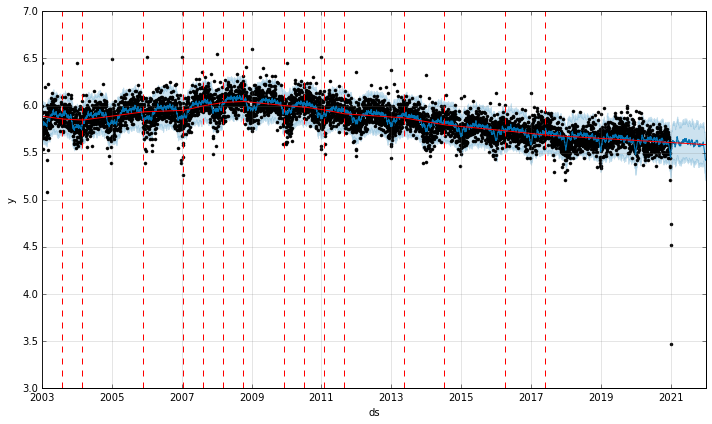

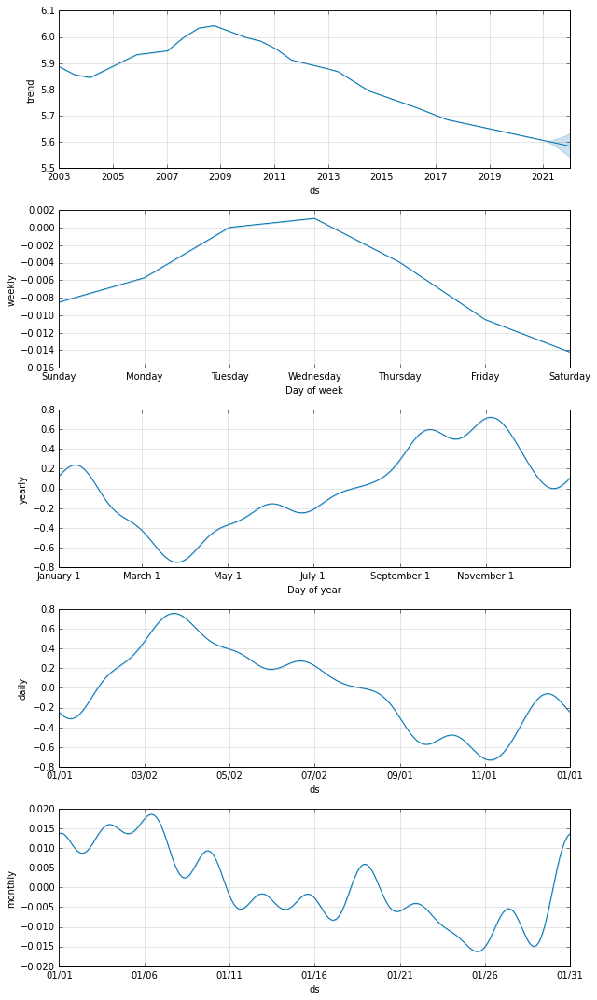

In [5]:
# Prepping to forecast
df_fbprophet = df.copy()
df_m = df_fbprophet.resample("D").size().reset_index()
df_m.columns = ["date", "daily_crime_count"]
df_m_final = df_m.rename(columns={"date": "ds", "daily_crime_count": "y"})
df_m_final["y"] = np.log(df_m_final["y"])
y = df_m_final["y"].to_frame()
y.index = df_m_final["ds"]
n = np.int(y.count())

m = Prophet(interval_width=0.95)
m.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m.add_seasonality(name="weekly", period=52, fourier_order=10)
m.add_seasonality(name="daily", period=365, fourier_order=10)
m.fit(df_m_final)

future = m.make_future_dataframe(periods=365, freq="D")

forecast = m.predict(future)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

fig2 = m.plot_components(forecast)

fig2_1 = plot_plotly(m, forecast)
fig2_1

In [6]:
# The forecast is 'log transformed', so we need to 'inverse' it back by using the exp
forecast_df_exp = np.exp(forecast[["yhat", "yhat_lower", "yhat_upper"]])
forecast_df_exp.index = forecast["ds"]

# Calculating MAPE error 
error = forecast_df_exp["yhat"] - y["y"]
MAPE_df = (error / y["y"]).abs().sum() / n * 100
round(MAPE_df, 2)

5837.05

## Mitigating outlier effects on model accuracy

In [7]:
# Make another copy of the data frame as m2
df_prophet2 = df_m_final.copy()

# Define the Upper Control Limit and Lower Control Limit as 3 standard deviations from the mean
ucl = df_prophet2.mean() + df_prophet2.std() * 3
lcl = df_prophet2.mean() - df_prophet2.std() * 3

# display the number of outliers found
print(
    "Above 3 standard deviations: ",
    df_prophet2[df_prophet2["y"] > ucl["y"]]["y"].count(),
    "entries",
)
print(
    "Below 3 standard deviations: ",
    df_prophet2[df_prophet2["y"] < lcl["y"]]["y"].count(),
    "entries",
)

Above 3 standard deviations:  12 entries
Below 3 standard deviations:  10 entries


INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


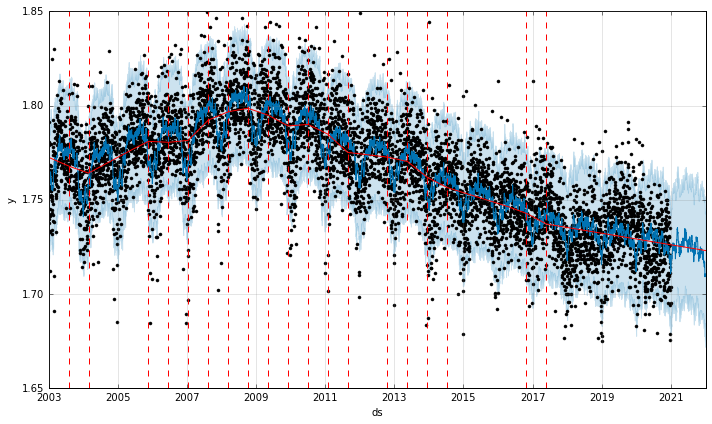

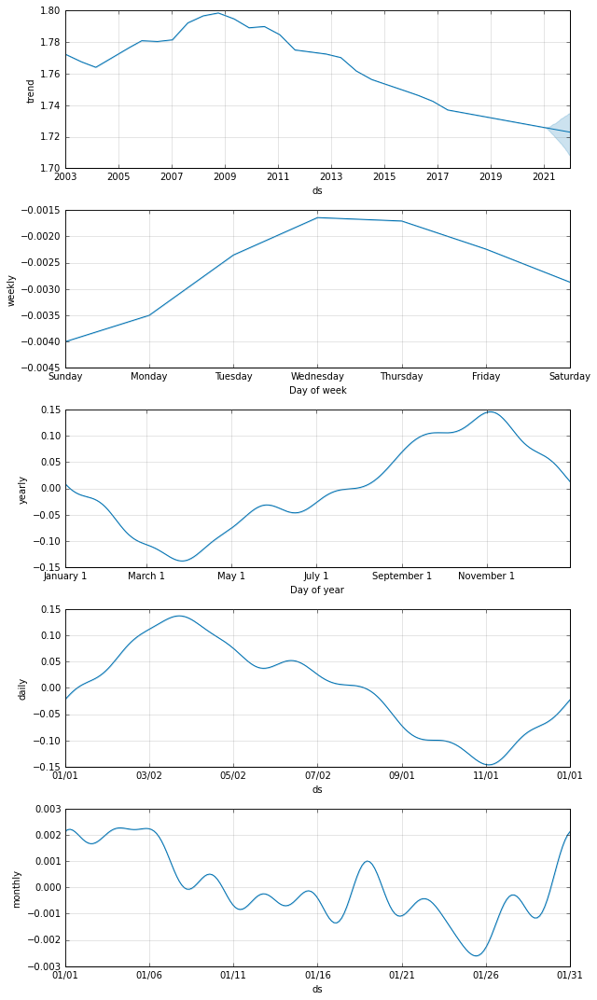

In [8]:
# Remove them by setting their value to None. Prophet says it can handle null values.
df_prophet2.loc[df_prophet2["y"] > ucl["y"], "y"] = None
df_prophet2.loc[df_prophet2["y"] < lcl["y"], "y"] = None

# Log transformation
df_prophet2["y"] = np.log(df_prophet2["y"])

# Run Prophet using model 2
m2 = Prophet(interval_width=0.95)
m2.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m2.add_seasonality(name="weekly", period=52, fourier_order=10)
m2.add_seasonality(name="daily", period=365, fourier_order=10)
m2.fit(df_prophet2)

future = m2.make_future_dataframe(periods=365)

forecast_m2 = m2.predict(future)

fig_m2 = m2.plot(forecast_m2)
a = add_changepoints_to_plot(fig_m2.gca(), m2, forecast_m2)

fig2m2 = m2.plot_components(forecast_m2)

fig2_1m2 = plot_plotly(m2, forecast_m2)
fig2_1m2

In [9]:
# Re-inversing the forecast
forecast_m2_exp = np.exp(forecast_m2[["yhat", "yhat_lower", "yhat_upper"]])
forecast_m2_exp.index = forecast_m2["ds"]

# RecalculatinG MAPE error
error = forecast_m2_exp["yhat"] - y["y"]
MAPE_m2 = (error / y["y"]).abs().sum() / n * 100
round(MAPE_m2, 2)

1.29